### Task 1:
Test power rails. Use a power supply limited to 0.1 A.

1. Remove all jumpers from the board, and all other removable
components.
2. Set the power supply to 5V and verify the current limit (e.g. using a 5
Ohm load resistor).
3. Connect the power supply to the output of the converter (J6) - this is
the only time that we will do this! Double-check the polarity of the
connection.

A. Verify that LED2 (red) lights up. The current consumption should
be at 10 mA or less. Carefully increase the power supply voltage
to 18V and confirm that the power consumption remains at 15
mA or less.


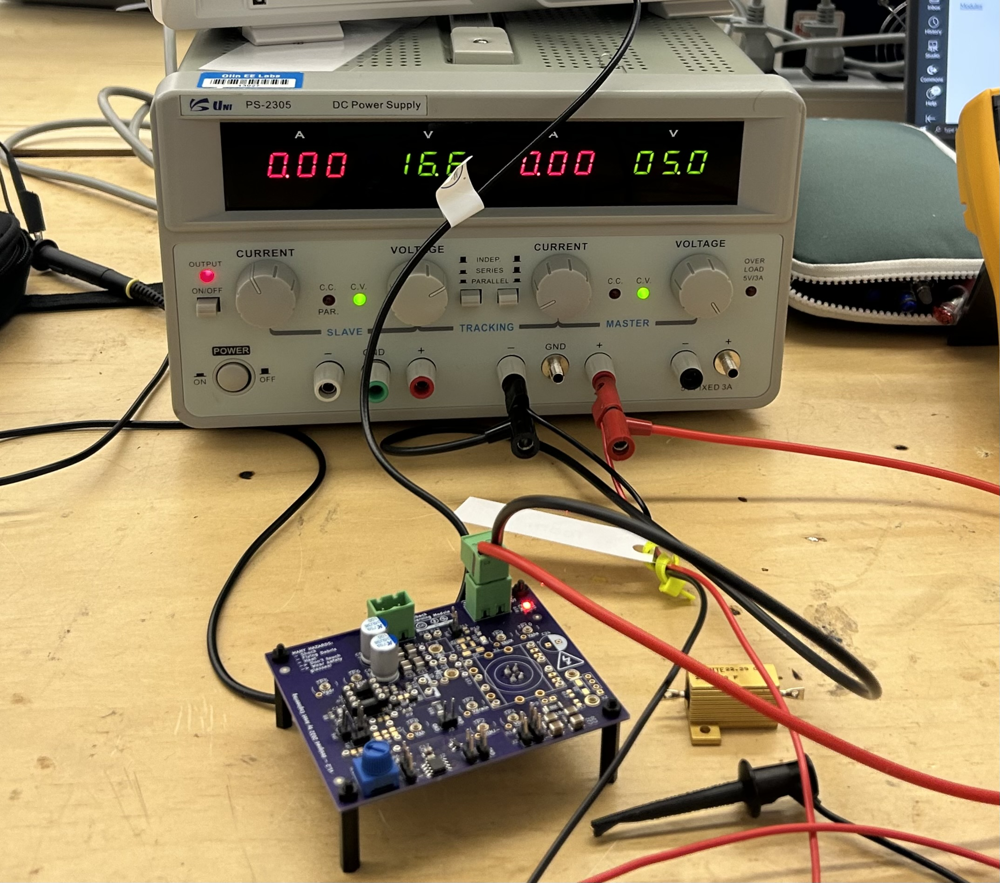

Power supply at 18V:

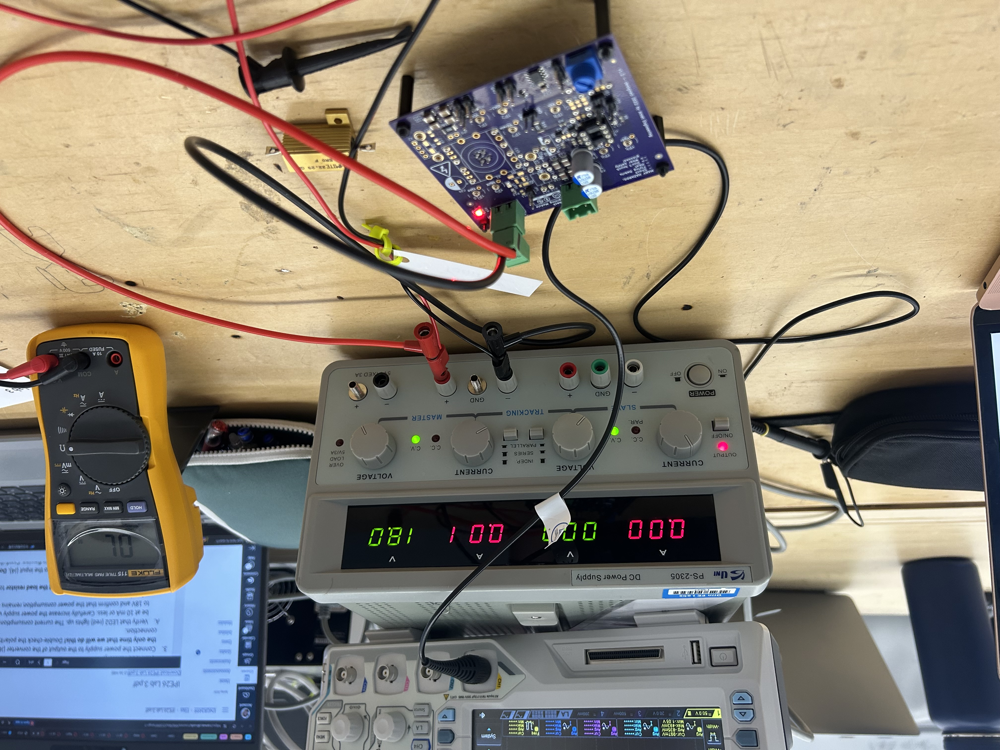

4. Disconnect the power supply and connect the load resistor to the
converter output (J6).
5. Set the power supply to 5V and connect it to the input (J4). Double

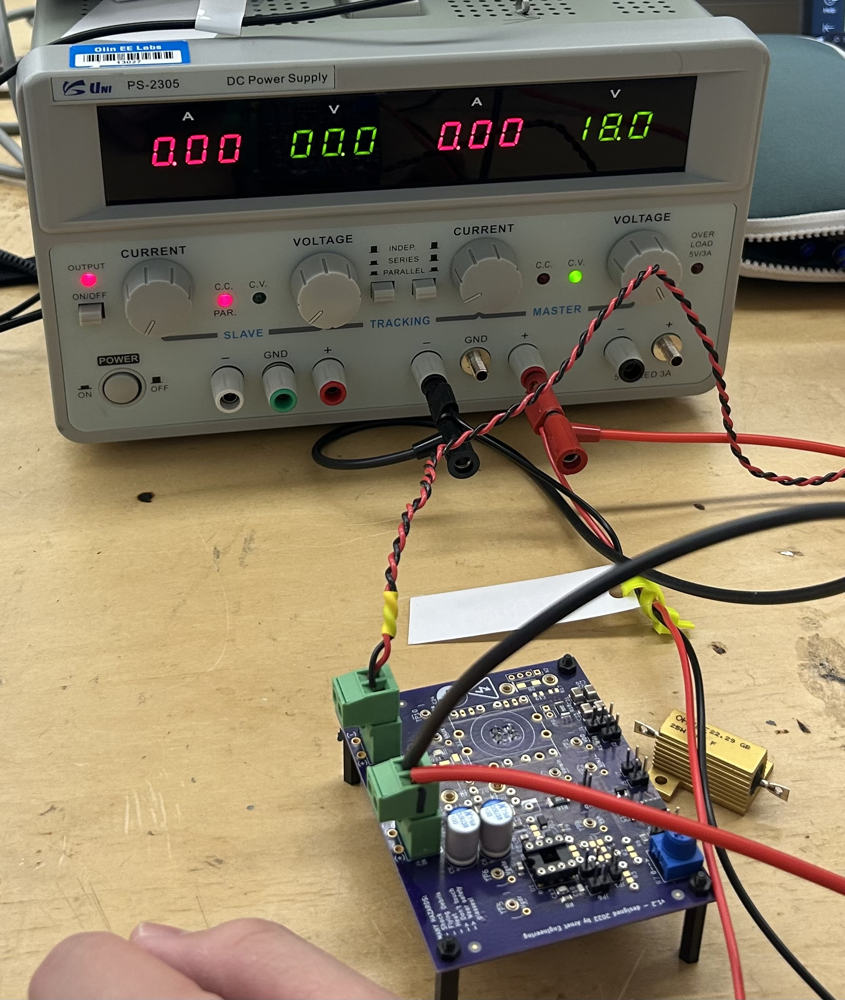

6. Set the power supply back to 5V and insert jumper JP5.

7. Verify that LED1 (green) lights up. Confirm that the current consumption remains at 15 mA or less up to 18V.
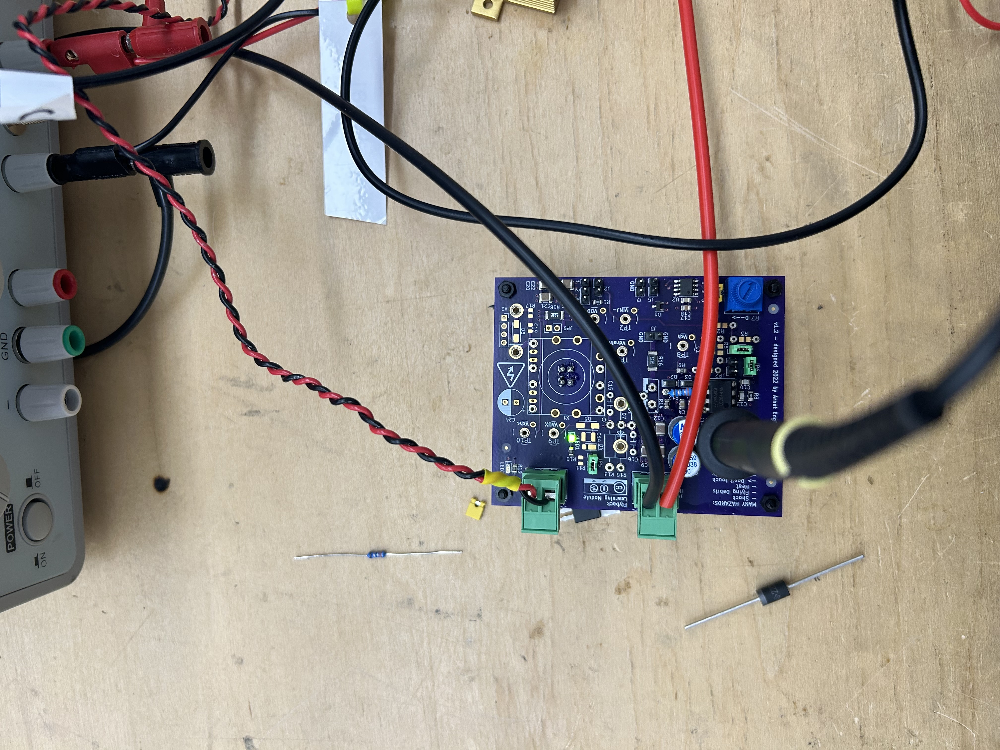


### TASK 2:
Test the basic operation of UC2844. Use a power supply limited to 0.1 A. With UC2844 in the U1 slot, JP1 and JP6 inserted, JP4 inserted in the 2-3 position, a 33 ohm gate resistor inserted, and the trim pot all the way clockwise (final state, I deleted the preparation steps): 

##### Q1: Measure the exact frequency, duty cycle and amplitude.

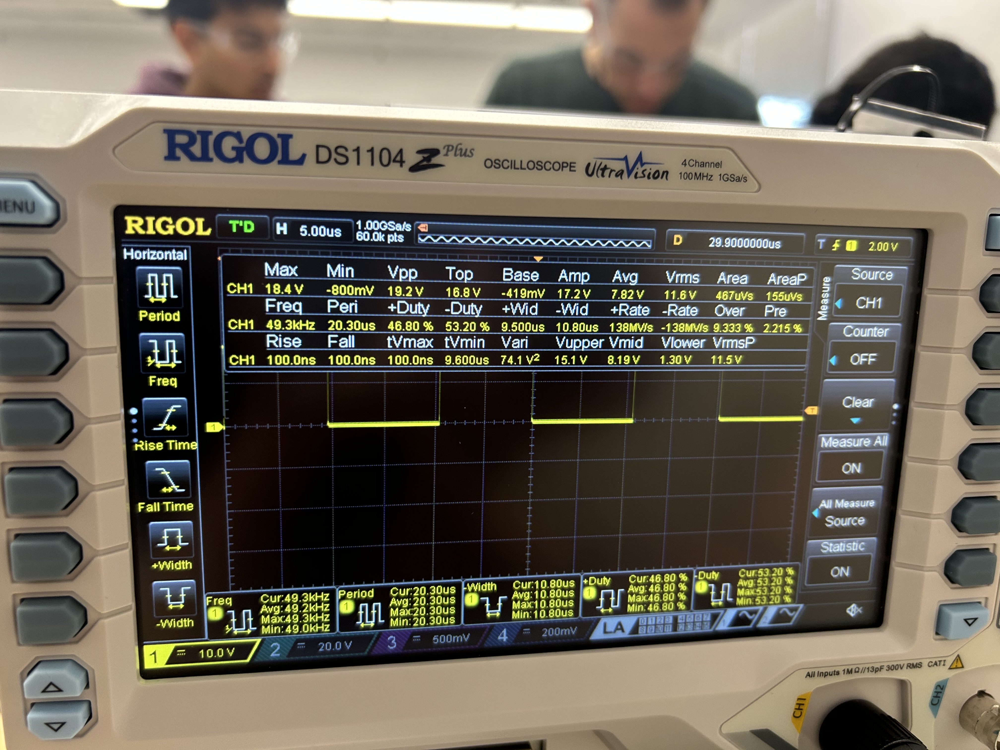

The oscilloscope shows that the frequency is 49.3kHz, duty cycle 46.80%, and amplitude is 17.2V. The wave blocked by the menu is a regular square wave.


### Task 3 (Preparation):
#### Q2: Make note of the label on the test inductor.
    Inductor 7

Plot the shunt voltage Vsh (TP8) and drain voltage Vdrain (TP7). Connect a DMM to measure the output voltage (J6).


### Task 3 (Execution): 
Plot the Vsh and drain Vdrain voltage measurements in Jupyter at 4V, 7V, and 9V to confirm quality and resolution. Log actual output voltages.


In [2]:
# Load in all files for analysis
import pandas as pd
from pathlib import Path

csv_dir = Path('./lab_3_power_e_2ch')
csv_files = list(csv_dir.glob('*.csv'))

test_data = {}


for csv_file in csv_files:
    df_name = csv_file.stem  # df same as file name
    test_data[df_name] = pd.read_csv(csv_file)
    print(f"Loaded {csv_file.name}")

Loaded t4d5_4v.csv
Loaded t4d5_9v.csv
Loaded t3d5_9v.csv
Loaded t2d7.csv
Loaded t3d5_4v.csv
Loaded t3d5_7v.csv
Loaded t4d5_7v.csv


### Task 3:
Plot shunt voltage Vsh (TP8) and drain voltage Vds (TP7) at 4V, 7V, and 9V output voltage.

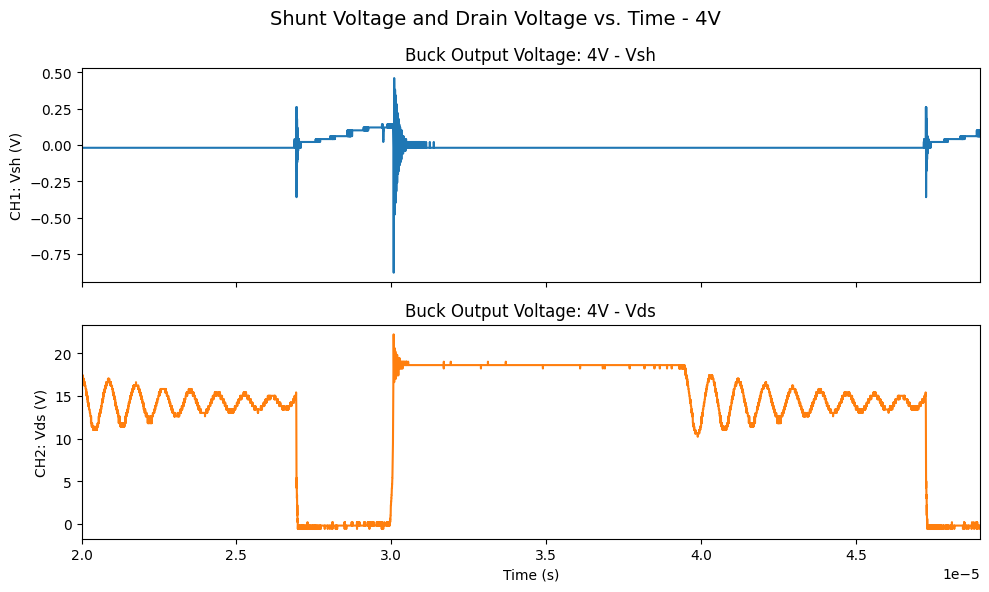

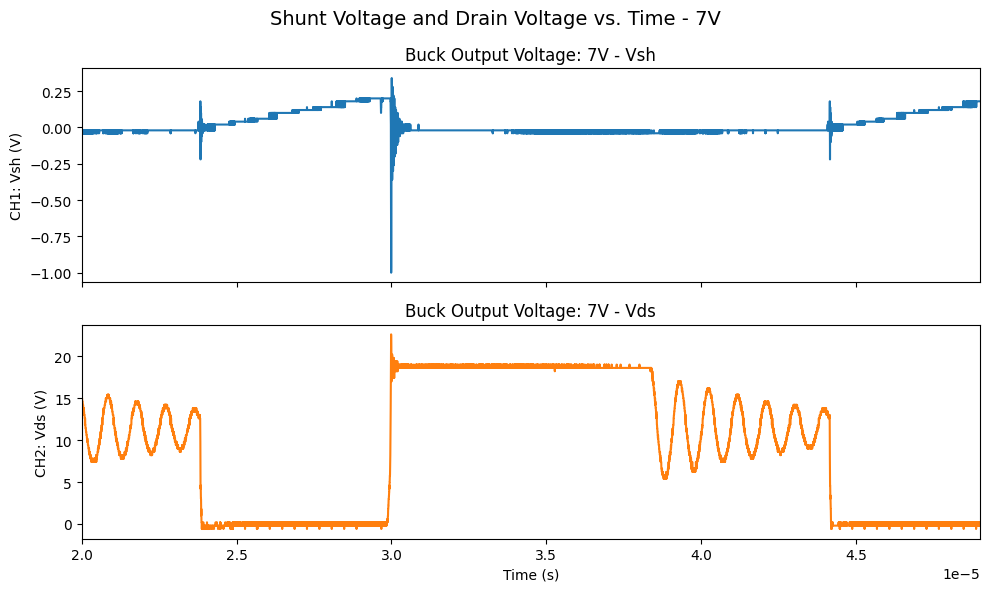

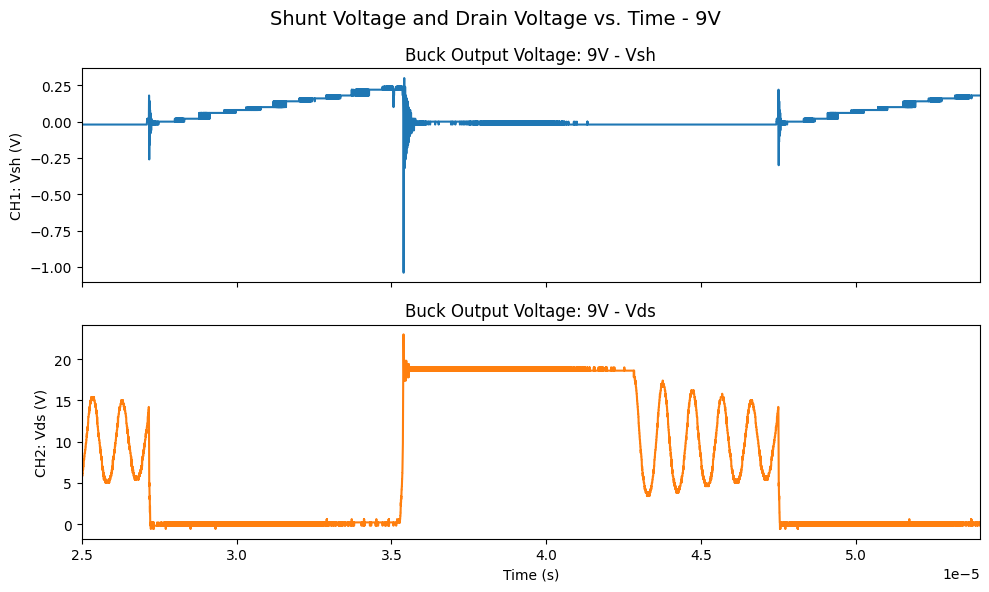

In [4]:
import matplotlib.pyplot as plt

t1 = pd.to_numeric(test_data['t3d5_4v']['X'], errors='coerce') * 2e-9
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 6), sharex=True)
fig.suptitle('Shunt Voltage and Drain Voltage vs. Time - 4V', fontsize=14)
ax1.plot(t1, test_data['t3d5_4v']['CH1'], color='tab:blue')
ax1.set_title('Buck Output Voltage: 4V - Vsh')
ax1.set_ylabel('CH1: Vsh (V)')
ax1.set_xlim(2e-5, 4.9e-5)
ax2.plot(t1, test_data['t3d5_4v']['CH2'], color='tab:orange')
ax2.set_title('Buck Output Voltage: 4V - Vds')
ax2.set_ylabel('CH2: Vds (V)')
ax2.set_xlabel('Time (s)')
ax2.set_xlim(2e-5, 4.9e-5)
plt.tight_layout()
plt.show()

t2 = pd.to_numeric(test_data['t3d5_7v']['X'], errors='coerce') * 2e-9
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 6), sharex=True)
fig.suptitle('Shunt Voltage and Drain Voltage vs. Time - 7V', fontsize=14)
ax1.plot(t2, test_data['t3d5_7v']['CH1'], color='tab:blue')
ax1.set_title('Buck Output Voltage: 7V - Vsh')
ax1.set_ylabel('CH1: Vsh (V)')
ax1.set_xlim(2e-5, 4.9e-5)
ax2.plot(t2, test_data['t3d5_7v']['CH2'], color='tab:orange')
ax2.set_title('Buck Output Voltage: 7V - Vds')
ax2.set_ylabel('CH2: Vds (V)')
ax2.set_xlabel('Time (s)')
ax2.set_xlim(2e-5, 4.9e-5)
plt.tight_layout()
plt.show()

t3 = pd.to_numeric(test_data['t3d5_9v']['X'], errors='coerce') * 2e-9
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 6), sharex=True)
fig.suptitle('Shunt Voltage and Drain Voltage vs. Time - 9V', fontsize=14)
ax1.plot(t3, test_data['t3d5_9v']['CH1'], color='tab:blue')
ax1.set_title('Buck Output Voltage: 9V - Vsh')
ax1.set_ylabel('CH1: Vsh (V)')
ax1.set_xlim(2.5e-5, 5.4e-5)
ax2.plot(t3, test_data['t3d5_9v']['CH2'], color='tab:orange')
ax2.set_title('Buck Output Voltage: 9V - Vds')
ax2.set_ylabel('CH2: Vds (V)')
ax2.set_xlabel('Time (s)')
ax2.set_xlim(2.5e-5, 5.4e-5)
plt.tight_layout()
plt.show()

### Task 4:
Plot gate driver output Vgdr (TP5) and gate voltage Vgate (TP6) at 4V, 7V, and 9V output voltage.

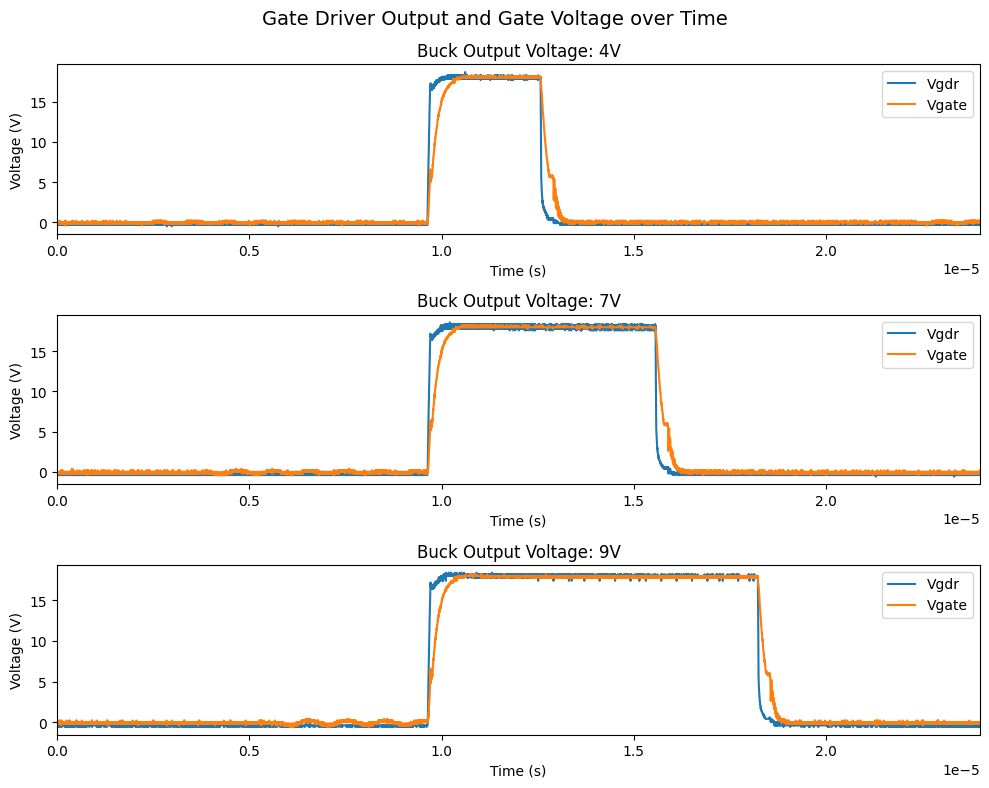

In [5]:
fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(10, 8))
fig.suptitle('Gate Driver Output and Gate Voltage over Time', fontsize=14)

t1 = test_data['t4d5_4v']['X'] * 2e-9
ax1.plot(t1, test_data['t4d5_4v']['CH1'], label='Vgdr')
ax1.plot(t1, test_data['t4d5_4v']['CH2'], label='Vgate')
ax1.set_title('Buck Output Voltage: 4V')
ax1.set_xlim(t1.min(), t1.max() * 0.4)
ax1.set_xlabel('Time (s)')
ax1.set_ylabel('Voltage (V)')
ax1.legend(loc='upper right')

t2 = test_data['t4d5_7v']['X'] * 2e-9
ax2.plot(t2, test_data['t4d5_7v']['CH1'], label='Vgdr')
ax2.plot(t2, test_data['t4d5_7v']['CH2'], label='Vgate')
ax2.set_title('Buck Output Voltage: 7V')
ax2.set_xlim(t2.min(), t2.max() * 0.4)
ax2.set_xlabel('Time (s)')
ax2.set_ylabel('Voltage (V)')
ax2.legend(loc='upper right')

t3 = test_data['t4d5_9v']['X'] * 2e-9
ax3.plot(t3, test_data['t4d5_9v']['CH1'], label='Vgdr')
ax3.plot(t3, test_data['t4d5_9v']['CH2'], label='Vgate')
ax3.set_title('Buck Output Voltage: 9V')
ax3.set_xlim(t3.min(), t3.max() * 0.4)
ax3.set_xlabel('Time (s)')
ax3.set_ylabel('Voltage (V)')
ax3.legend(loc='upper right')

plt.tight_layout()
plt.show()

### Post lab analysis:

#### Q3: Use the measurements taken to determine:

1. the inductance value of the test inductor.

We know that the circuit is operating in discontinuous conduction mode because at each of the three different output levels, there exists a flat section where the voltage is 0 and no current is flowing.  Thus, we can use following equations to solve for L.

$D_{dcm} = \sqrt{\frac{k}{1-M}}*M$

$k=\frac{2L}{T_s*R}$

$L = (\frac{D_{dcm}}{M})^2*\frac{(1-M)*T_s*R}{2}$

Then, we can plug in our measured values and get the following result:

In [ ]:
import numpy as np

# Constants
output_voltages = [4.01, 7.00, 9.02] #V
Vg = 18
Fs = 49300 # from scope measurement
Ts = 1/Fs
R = 5 # load resistance
R_sh = 0.05 # shunt resistance

inductances = [0.0, 0.0, 0.0]

for i, voltage in enumerate(['t4d5_4v', 't4d5_7v', 't4d5_9v']):
    # analyzing Vgdr to find duty cycle
    t2 = test_data[voltage]['X'].to_numpy()
    v = test_data[voltage]['CH1'].to_numpy()

    # threshold (50% of max)
    thr = 0.5 * (v.max() + v.min())
    is_high = v > thr
    edges = np.diff(is_high.astype(int))
    rising = np.where(edges == 1)[0]
    falling = np.where(edges == -1)[0]

    num_cycles = min(len(rising) - 1, len(falling))
    duty_cycles = []
    for n in range(num_cycles):
        r0 = rising[n]
        f0 = falling[falling > r0][0]
        r1 = rising[rising > f0][0]
        t_on = t2[f0] - t2[r0]
        T = t2[r1] - t2[r0]
        duty_cycles.append(t_on / T)

    duty = np.mean(duty_cycles)
    print(f"Duty Cycle: {duty:.5f}")
    
    M = output_voltages[i]/Vg
    inductances[i] = (duty/M)**2*(1-M)*R*Ts/2
    print(
        f"Calculated inductance from {output_voltages[i]}V "
        f"duty cycle: {inductances[i]*1e6:.2f} uH\n")

final_L = np.mean(inductances)
print(f"The measured inductance is approximately {final_L*1e6:.2f} uH")

Duty Cycle: 0.14351
Calculated inductance from 4.01V duty cycle: 16.36 uH

Duty Cycle: 0.29047
Calculated inductance from 7.0V duty cycle: 17.29 uH

Duty Cycle: 0.42121
Calculated inductance from 9.02V duty cycle: 17.87 uH

The measured inductance is approximately 17.17 uH



##### Q4: Update your digital twin (PLECS model) with the inductance
value and measured switching frequency. Make sure you submit your
personal digital twin PLECS file with this lab report.

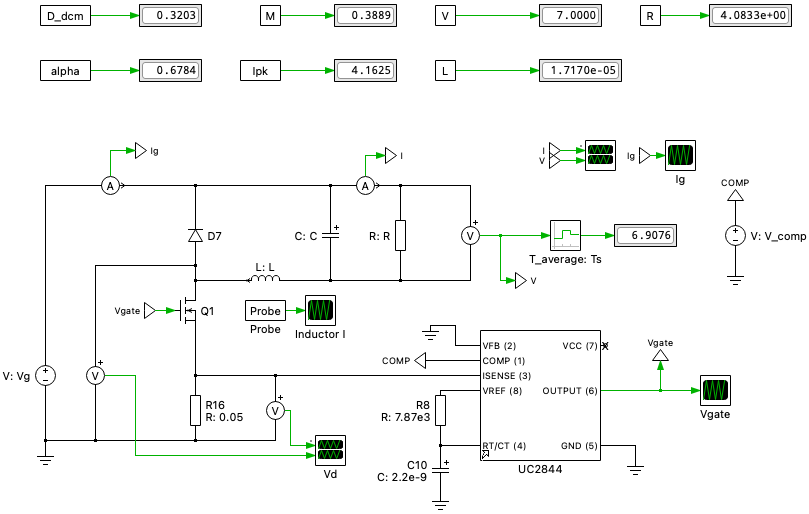

In [ ]:
% initialization script
Vg = 18.00
V = 7.00
Pout = 12

% measured switching frequency
Fs = 49300 
Ts = 1/Fs
% measured inductance
L = 17.17e-6 % average inductance

D = 0.35
C = 60e-6

% Calculated outputs
M = V/Vg
R = V**2/Pout
% L = ((R*Ts*(1-M))/2)*(D/M)**2
Lcrit = (1-M)*R*(Ts/2)
alpha = L/Lcrit

k = 2*L/(Ts*R)
Ipk = ((k*(1-M))**0.5)*Ts*V/L

% Calculated Values
V_comp = (3*Ipk + 26)/20

##### Q5: Run simulations corresponding to the measurements taken
during Task 3 and compare the waveforms (shape, amplitude, timing,
duty cycle) of the shunt-voltage and drain voltage.

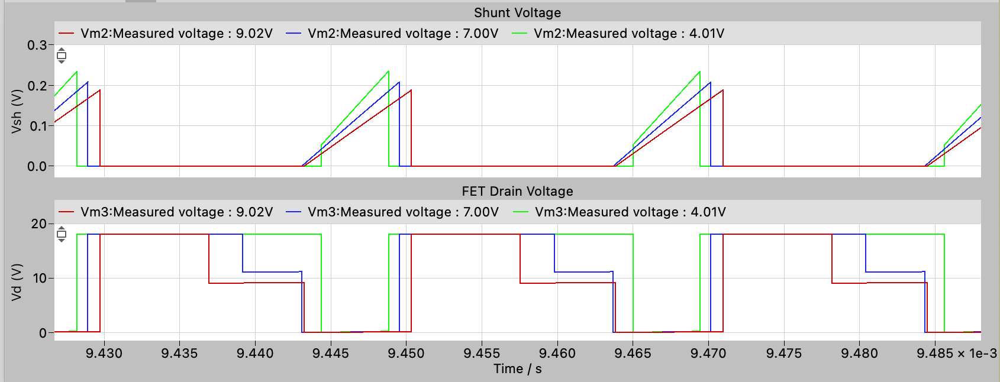

The waveforms of the shunt and drain voltages follow a similar shape to
the actual measured values, but the measured output has many more real-world
effects. The most evident of these are the ringing that occurs in the Vdrain
when the voltage switches to a different level, the two spikes in shunt voltage 
that happen when the MOSFET opens or closes, and the ringing visible in Vdrain 
when the MOSFET closes.

Similiarities between the two are that the max FET drain voltage reaches 18V
in simulation and the real data also has a long on section at 18V, although
there is a small spike right before it when the MOSFET is switching. Both
datasets also have a step down from the main voltage of 18V to a lower voltage,
although the measured dataset has an oscillating pattern around that value
instead of a clean drop to the lower value. Interestingly, the 4V output in
simulation does not drop to a lower value like the rest of them even though 
the measured output does.

Both simulation and real data have the same frequency across all voltages, 
which makes sense since I set the simulation to have that frequency and 
frequency is constant regardless of output voltage, since it's determined 
by the chip. The measured 9.02V output wave seems to be phase shifted from
the other two waves (as seen in the third plot I created in Task 3).

The simulated duty cycle value is 0.32 with an output voltage of 7V, and my
measured duty cycle value is 0.29, which is quite close.

##### Q6: Are the simplifying assumptions made in our theoretical study of the buck converter valid?

We make the assumption that all of the components that make up our buck
are perfectly ideal and lossless, which is an incomplete representation
of reality. We don't account for things like parasitics or heat losses.
However, it is still useful to model them this way educationally, and it
teaches us what parts of the circuit behavior are a result of unideal
components and what parts are part of the theoretical circuit operation.
For instance, the ideal behavior of the components does not capture the 
ringing effect we observe in the real measurements, so we know that comes
from unmodeled real-world behaviors.

##### Q7: Does the measured peak-current and duty-cycle match the theoretical predictions?

In [81]:
t2 = pd.to_numeric(test_data['t3d5_7v']['X'], errors='coerce') * 2e-9
data_7v = test_data['t3d5_7v']['CH1']
peak_voltage_before_ring = np.interp(2.95e-5, t2, data_7v)
print(f"Peak voltage before ringing at 7V: {peak_voltage_before_ring:.4f} V")
measured_ipk_7v = peak_voltage_before_ring / 0.05
sim_ipk = 0.208126 / 0.05
print(f"Measured peak current at 7V: {measured_ipk_7v:.2f} A")
print(f"Simulated peak current at 7V: {sim_ipk:.2f} A")

Peak voltage before ringing at 7V: 0.2000 V
Measured peak current at 7V: 4.00 A
Simulated peak current at 7V: 4.16 A


Our measured peak-current value can be extracted by dividing the V_sh
measurements by our shunt resistance, since V=IR. Extracting the 
max shunt voltage from the 7V plot using np.interp gets us 0.2V, while 
the PLECS sim gives us a shunt voltage of 0.208126. Dividing this 
simulated value by our shunt resistance of 0.05 ohms
gets us about 4.16A of peak current for our 7V output simulation. The
0.2V measured value gives us 4A, which matches very well.

Our measured duty cycle also matches the theoretical quite well for 7V, it being
at 0.3203 in our simulation and 0.2905 in our measurements.

##### Q8: Plot the gate voltage and gate current during MOSFET turn-on and turn-off for output voltages 4V, 7V and 9V.

$I_{gate} = \frac{V_{gdr} - V_{gate}}{R_{gate}}$


Max gate current for 4V: 0.3606 A
Max gate current for 7V: 0.3576 A
Max gate current for 9V: 0.3576 A


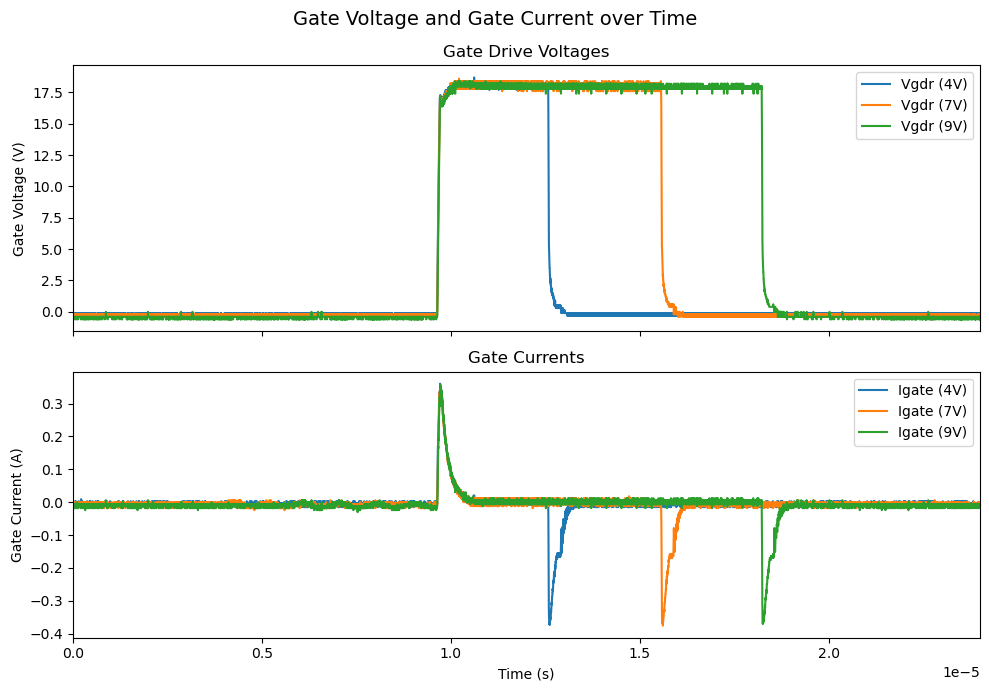

In [93]:
Rgate = 33
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 7), sharex=True)
fig.suptitle('Gate Voltage and Gate Current over Time', fontsize=14)

datasets = [
    ('4V', test_data['t4d5_4v']),
    ('7V', test_data['t4d5_7v']),
    ('9V', test_data['t4d5_9v'])
]

for label, data in datasets:
    t = data['X'] * 2e-9
    v_gdr = data['CH1']
    i_gate = (data['CH1'] - data['CH2']) / Rgate
    
    # voltage subplots
    ax1.plot(t, v_gdr, label=f'Vgdr ({label})')
    
    # current subplots
    ax2.plot(t, i_gate, label=f'Igate ({label})')
    print(f"Max gate current for {label}: {i_gate.max():.4f} A")

ax1.set_ylabel('Gate Voltage (V)')
ax1.set_title('Gate Drive Voltages')
ax1.legend(loc='upper right')

ax2.set_ylabel('Gate Current (A)')
ax2.set_xlabel('Time (s)')
ax2.set_title('Gate Currents')
ax2.legend(loc='upper right')

# setting limits
t_sample = datasets[0][1]['X'] * 2e-9
ax2.set_xlim(t_sample.min(), t_sample.max() * 0.4)

plt.tight_layout()
plt.show()

##### Q9: Are we respecting maximal allowable gate voltage for the MOSFET? Explain.

The maximum gate voltage we apply to the circuit is 18V, which is well
below the +/-30V rating that the FDP61N20 MOSFET lists in its datasheet. 
This means we are respecting the maximal allowable gate voltage and the 
MOSFET is in a good operating state.

##### Q10: Are we respecting the maximal allowable output current of the UC2844? Explain.

The UC2844 datasheet lists a max output drive current (I_output) of +/-1A
in its absolute maximum ratings section, but the recommended operating
conditions suggests a maximum of 200mA. The maximum current that the measured
circuit experiences in any of the three output voltage levels is 0.3606A (see
4V print statements in the plot above), which is above the recommended level 
but well below the 1A absolute maximum. Thus, we are respecting the 
maximal allowable output current of the UC2844.